In [ ]:
# !pip list | egrep -w "diffusers|quanto|transformers"

```
diffusers                     0.30.0
optimum-quanto                0.2.4
sentence-transformers         2.3.1
transformers                  4.40.2
transformers-stream-generator 0.0.5
```

In [1]:
import torch

from optimum.quanto import freeze, qfloat8, quantize, qint8, qint4

from diffusers import FlowMatchEulerDiscreteScheduler, AutoencoderKL
from diffusers.models.transformers.transformer_flux import FluxTransformer2DModel
from diffusers.pipelines.flux.pipeline_flux import FluxPipeline
from transformers import CLIPTextModel, CLIPTokenizer,T5EncoderModel, T5TokenizerFast

# black-forest-labs/FLUX.1-schnell
fluxrepo_local = "/home/g/models/FLUX.1-dev"
dtype = torch.bfloat16

scheduler = FlowMatchEulerDiscreteScheduler.from_pretrained(
    fluxrepo_local, 
    subfolder="scheduler"
)
text_encoder = CLIPTextModel.from_pretrained(
    fluxrepo_local, 
    subfolder="text_encoder", 
    torch_dtype=dtype
)
tokenizer = CLIPTokenizer.from_pretrained(
    fluxrepo_local, 
    subfolder="tokenizer", 
    torch_dtype=dtype
)
text_encoder_2 = T5EncoderModel.from_pretrained(
    fluxrepo_local, 
    subfolder="text_encoder_2", 
    torch_dtype=dtype
)
tokenizer_2 = T5TokenizerFast.from_pretrained(
    fluxrepo_local, 
    subfolder="tokenizer_2", 
    torch_dtype=dtype
)
vae = AutoencoderKL.from_pretrained(
    fluxrepo_local, 
    subfolder="vae", 
    torch_dtype=dtype
)
transformer = FluxTransformer2DModel.from_pretrained(
    fluxrepo_local, 
    subfolder="transformer", 
    torch_dtype=dtype
).to("cuda")

pipe = FluxPipeline(
    scheduler=scheduler,
    text_encoder=text_encoder,
    tokenizer=tokenizer,
    text_encoder_2=text_encoder_2,
    tokenizer_2=tokenizer_2,
    vae=vae,
    transformer=transformer,
)

Loading checkpoint shards:   0%|          | 0/2 [00:00<?, ?it/s]

You set `add_prefix_space`. The tokenizer needs to be converted from the slow tokenizers


In [2]:
pipe.load_lora_weights(
    "/home/g/flux/ai-toolkit/output/flux_dev_lora_gs/", 
    weight_name="flux_dev_lora_gs.safetensors")
pipe.fuse_lora()

In [4]:
## OOM on a 3090 if you don't quantize these two 
# print("quantizing transformer ..")
quantize(pipe.transformer.to("cuda"), weights=qfloat8)
freeze(pipe.transformer)

# print("quantizing text_encoder_2 ..")
quantize(pipe.text_encoder_2.to("cuda"), weights=qfloat8)
freeze(pipe.text_encoder_2)

pipe.to("cuda")

# pipe.enable_sequential_cpu_offload()
# pipe.vae.enable_slicing()
# pipe.vae.enable_tiling()

FluxPipeline {
  "_class_name": "FluxPipeline",
  "_diffusers_version": "0.30.0",
  "scheduler": [
    "diffusers",
    "FlowMatchEulerDiscreteScheduler"
  ],
  "text_encoder": [
    "transformers",
    "CLIPTextModel"
  ],
  "text_encoder_2": [
    "transformers",
    "T5EncoderModel"
  ],
  "tokenizer": [
    "transformers",
    "CLIPTokenizer"
  ],
  "tokenizer_2": [
    "transformers",
    "T5TokenizerFast"
  ],
  "transformer": [
    "diffusers",
    "FluxTransformer2DModel"
  ],
  "vae": [
    "diffusers",
    "AutoencoderKL"
  ]
}

  0%|          | 0/30 [00:00<?, ?it/s]

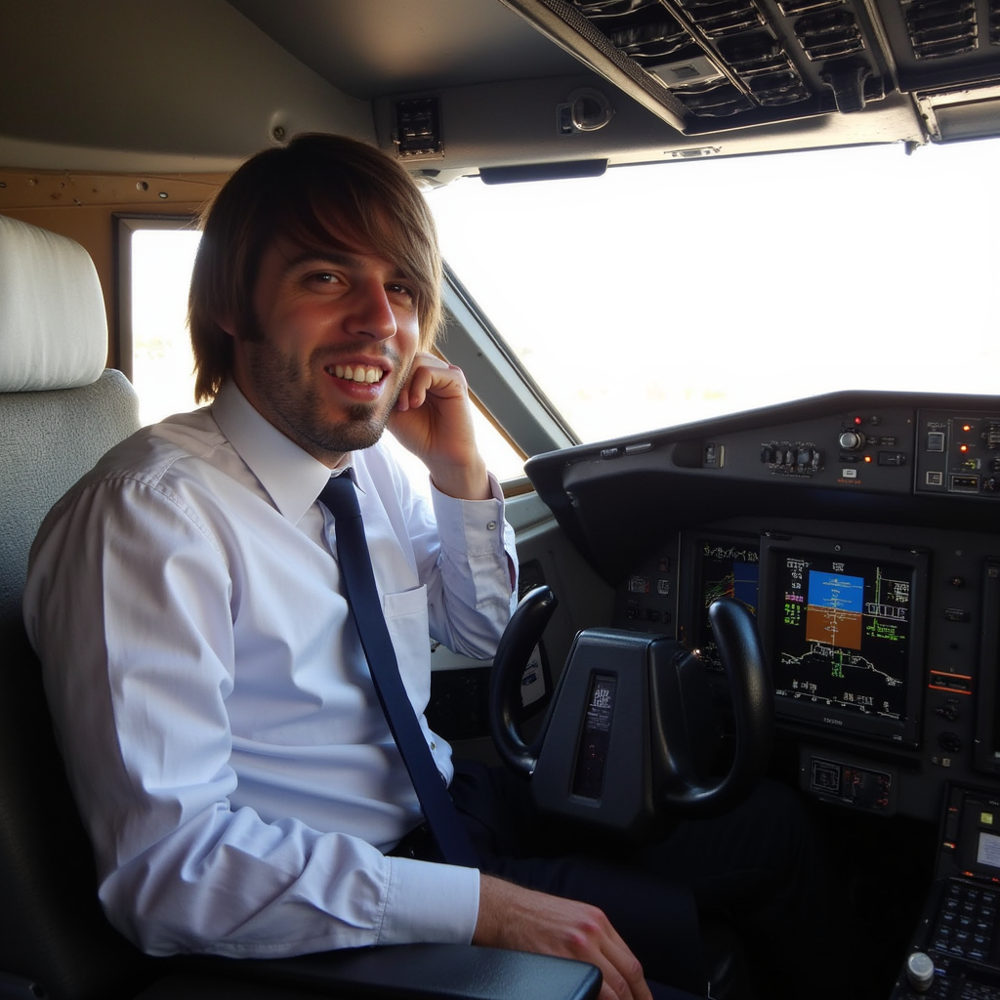

In [72]:
prompt = "p3r5on as a heppy pilot in a Boeing 747, shot in the cockpit"
seed = 42

image = pipe(
    prompt,
    height=1024,
    width=1024,
    guidance_scale=3.5,
    num_inference_steps=30,
    max_sequence_length=512,
    generator=torch.Generator("cpu").manual_seed(seed)
).images[0]
image

In [86]:
prompt = "p3r5on as a happy pilot in a Boeing 747, shot in the cockpit"
seed = 42

steps_ = [10, 20, 30, 40, 50]
# steps_ = [5, 6, 7]
images = []

for steps in steps_:
    print(f"{prompt}: {steps} ..")
    image = pipe(
        prompt,
        height=1024,
        width=1024,
        guidance_scale=3.5,
        num_inference_steps=steps,
        max_sequence_length=512,
        generator=torch.Generator("cpu").manual_seed(seed)
    ).images[0]
    images.append(image)
# image.save("flux-dev-CUDA.png")

p3r5on as a happy pilot in a Boeing 747, shot in the cockpit: 10 ..


  0%|          | 0/10 [00:00<?, ?it/s]

p3r5on as a happy pilot in a Boeing 747, shot in the cockpit: 20 ..


  0%|          | 0/20 [00:00<?, ?it/s]

p3r5on as a happy pilot in a Boeing 747, shot in the cockpit: 30 ..


  0%|          | 0/30 [00:00<?, ?it/s]

p3r5on as a happy pilot in a Boeing 747, shot in the cockpit: 40 ..


  0%|          | 0/40 [00:00<?, ?it/s]

p3r5on as a happy pilot in a Boeing 747, shot in the cockpit: 50 ..


  0%|          | 0/50 [00:00<?, ?it/s]

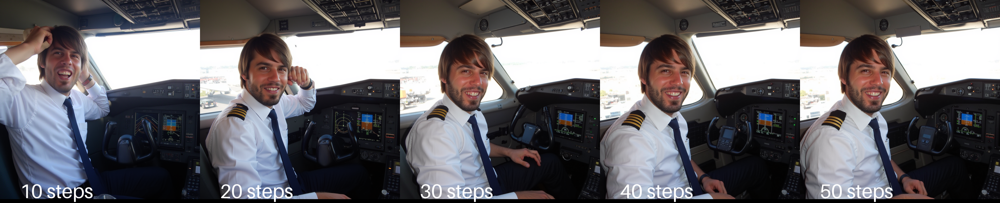

In [90]:
from typing import List
from PIL import Image, ImageDraw, ImageFont

# thank you codestral
def make_image_grid(images: List[Image.Image], labels: List[str], rows: int, cols: int, resize: int = None) -> Image.Image:
    if resize is not None:
        images = [img.resize((resize, resize)) for img in images]

    w, h = images[0].size
    grid = Image.new("RGB", size=(cols * w, rows * h + 20 * rows))  # Add extra space for labels

    # font = ImageFont.truetype("/usr/share/fonts/truetype/freefont/FreeSansBold.ttf", 100)
    font = ImageFont.load_default(100)

    for i, img in enumerate(images):
        grid.paste(img, box=(i % cols * w, i // cols * h + 20 * (i // cols)))  # Adjust y-coordinate for labels
        draw = ImageDraw.Draw(grid)
        draw.text((i%cols * w + w * 0.1, (i//cols + 1) * h - h * 0.1), labels[i], font=font, fill=(255, 255, 255))  # Draw label in black color

    return grid
    
gallery = make_image_grid(
    images, 
    [f"{str(steps)} steps" for steps in steps_], 
    1, 
    5)
gallery

In [91]:
gallery.save(prompt.replace(" ", "_") + ".png")